In [ ]:
&!nvidia-smi  # check GPU
!pip install ultralytics==8.0.196  # stable YOLOv8 version


/bin/bash: line 1: nvidia-smi: command not found
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 631.1/631.1 kB 13.3 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
import os
import matplotlib.pyplot as plt
import cv2
!pip install -q roboflow torch torchvision albumentations segmentation-models-pytorch opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.6/88.6 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 22.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 65.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 116.3 MB/s eta 0:00:00


In [ ]:
# Install roboflow
!pip install roboflow

# Authenticate and download dataset
from roboflow import Roboflow
rf = Roboflow(api_key="gJ3HEvdVTZSuII3EvZ27")
project = rf.workspace("mitosisdetection").project("ms-mitosis-detection2")
version = project.version(1)
dataset = version.download("yolov8")

# Check dataset location
print("Dataset downloaded to:", dataset.location)
!ls {dataset.location}


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to ms-mitosis-detection2-1 in yolov8:: 100%|██████████| 86844/86844 [00:08<00:00, 10424.01it/s]


Dataset downloaded to: /content/ms-mitosis-detection2-1
data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


In [ ]:
import os

IMAGE_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff', '.webp'}

def is_image_file(filename):
    return os.path.splitext(filename)[1].lower() in IMAGE_EXTENSIONS

def list_directory(path, indent=0):
    try:
        items = sorted(os.listdir(path))
    except PermissionError:
        print('  ' * indent + '📁 [Permission Denied]')
        return

    image_count = 0
    image_limit_hit = False

    for item in items:
        full_path = os.path.join(path, item)
        is_dir = os.path.isdir(full_path)
        is_image = is_image_file(item)

        if is_image:
            if image_count < 5:
                print('  ' * indent + f'🖼️ {item}')
            image_count += 1
            if image_count == 6 and not image_limit_hit:
                print('  ' * indent + '...')
                image_limit_hit = True
            continue

        if is_dir:
            print('  ' * indent + f'📁 {item}/')
            list_directory(full_path, indent + 1)
        elif not is_image:
            print('  ' * indent + f'📄 {item}')

# use dataset.location so it always matches where Roboflow downloaded
datasets_folder = dataset.location

if os.path.exists(datasets_folder):
    print(f"Mapping contents of '{datasets_folder}'...\n")
    list_directory(datasets_folder)
else:
    print(f"The folder '{datasets_folder}' does not exist.")


Streaming output truncated to the last 5000 lines.
    📄 A11_04Db_jpg.rf.80ddc3418e33447baa2ac3e95771e34b.txt
    📄 A11_04Db_jpg.rf.88bbacaff746b34a0510fc596f1cdb36.txt
    📄 A11_04Db_jpg.rf.88be2738310cb98aa02173a4e62ad3fb.txt
    📄 A11_04Db_jpg.rf.8b7caed7a9daf38bc5368983ef50fc3e.txt
    📄 A11_04Db_jpg.rf.919ab6ca9bffc62ab9829d35ba6fb96b.txt
    📄 A11_04Db_jpg.rf.92553cb1449fb2e9df37b7a36acd72ee.txt
    📄 A11_04Db_jpg.rf.93e37a0396bec1dbc0ebbe1e22aefc28.txt
    📄 A11_04Db_jpg.rf.9513daac917be8461465f23361daa10c.txt
    📄 A11_04Db_jpg.rf.96113683f2b15c91301e86893cbc3f4c.txt
    📄 A11_04Db_jpg.rf.97d47a12e0f0030f148e9fcf0c2f53cc.txt
    📄 A11_04Db_jpg.rf.9f9c469e0cc9ce3cee7729adf7d8aa0b.txt
    📄 A11_04Db_jpg.rf.a425ee1ef21423ea67434ca16754f109.txt
    📄 A11_04Db_jpg.rf.a72152674e0ad4ba4cf51993cbcbb4b8.txt
    📄 A11_04Db_jpg.rf.a9566d5cd5fb4bda82ad1aa1e5b9e83e.txt
    📄 A11_04Db_jpg.rf.b0305ebba5537e276721d05e356a8483.txt
    📄 A11_04Db_jpg.rf.b05de583e0fb8c8f430c220325bd47ce.txt
    📄

In [ ]:
import os

def list_directory(path, indent=0, max_files=5):
    try:
        items = sorted(os.listdir(path))
    except PermissionError:
        print('  ' * indent + '📁 [Permission Denied]')
        return

    shown = 0
    for item in items:
        full_path = os.path.join(path, item)
        if os.path.isdir(full_path):
            print('  ' * indent + f'📁 {item}/')
            list_directory(full_path, indent + 1, max_files)
        else:
            if shown < max_files:
                print('  ' * indent + f'📄 {item}')
            elif shown == max_files:
                print('  ' * indent + '...')
            shown += 1

# 👇 Use the dataset Roboflow downloaded
datasets_folder = dataset.location

if os.path.exists(datasets_folder):
    print(f"Mapping contents of '{datasets_folder}'...\n")
    list_directory(datasets_folder, max_files=5)
else:
    print(f"The folder '{datasets_folder}' does not exist.")


Mapping contents of '/content/ms-mitosis-detection2-1'...

📄 README.dataset.txt
📄 README.roboflow.txt
📄 data.yaml
📁 test/
  📁 images/
    📄 A03_00Cd_jpg.rf.036306ebdd438300f4ca70d5c4079acd.jpg
    📄 A03_00Cd_jpg.rf.055619019388459cce6b41d481a92e9d.jpg
    📄 A03_00Cd_jpg.rf.065188e9e2701c7b81b25b19838d6338.jpg
    📄 A03_00Cd_jpg.rf.08b4b388eeaffcd7ab23f0dbd8ccd08e.jpg
    📄 A03_00Cd_jpg.rf.0c0fc02e06ccfe6bac477f56e31b1c39.jpg
    ...
  📁 labels/
    📄 A03_00Cd_jpg.rf.036306ebdd438300f4ca70d5c4079acd.txt
    📄 A03_00Cd_jpg.rf.055619019388459cce6b41d481a92e9d.txt
    📄 A03_00Cd_jpg.rf.065188e9e2701c7b81b25b19838d6338.txt
    📄 A03_00Cd_jpg.rf.08b4b388eeaffcd7ab23f0dbd8ccd08e.txt
    📄 A03_00Cd_jpg.rf.0c0fc02e06ccfe6bac477f56e31b1c39.txt
    ...
📁 train/
  📁 images/
    📄 A03_00Aa_jpg.rf.0ff4ab35e122d74a42e7b74a77daeaf4.jpg
    📄 A03_00Aa_jpg.rf.16022bd276f99f388c25a2cda63c44ad.jpg
    📄 A03_00Aa_jpg.rf.182f8d3c12548fd43fd0efeb5130fbab.jpg
    📄 A03_00Aa_jpg.rf.23652e9d18fd413799472e8b06d7

In [ ]:
import os

base_path = '/content/ms-mitosis-detection2-1'
splits = ['train', 'valid', 'test']
image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff'}

for split in splits:
    folder_path = os.path.join(base_path, split, "images")  # ✅ go into split/images
    if os.path.exists(folder_path):
        image_files = [f for f in os.listdir(folder_path)
                       if os.path.splitext(f)[1].lower() in image_extensions]
        print(f"{split.capitalize()} images: {len(image_files)}")
    else:
        print(f"{split.capitalize()} folder not found.")


Train images: 26064
Valid images: 10908
Test images: 6444


In [ ]:
import os

base_path = "/content/ms-mitosis-detection2-1"
splits = ["train", "valid", "test"]

# Step 1: Count images and labels
for split in splits:
    img_dir = os.path.join(base_path, split, "images")
    lbl_dir = os.path.join(base_path, split, "labels")

    num_images = len(os.listdir(img_dir)) if os.path.exists(img_dir) else 0
    num_labels = len(os.listdir(lbl_dir)) if os.path.exists(lbl_dir) else 0

    print(f"{split.capitalize()} → Images: {num_images}, Labels: {num_labels}")

# Step 2: Show a few sample label files
label_dir = os.path.join(base_path, "train", "labels")
if os.path.exists(label_dir):
    sample_labels = os.listdir(label_dir)[:3]

    print("\nSample label files content:")
    for label_file in sample_labels:
        print(f"\n📄 {label_file}")
        with open(os.path.join(label_dir, label_file)) as f:
            print(f.read().strip())
else:
    print("\n⚠️ No labels found in train/labels")


Train → Images: 26064, Labels: 26064
Valid → Images: 10908, Labels: 10908
Test → Images: 6444, Labels: 6444

Sample label files content:

📄 A05_01Bc_jpg.rf.f2100b089868cb07d7dd4ce3cb096c7c.txt
0 0.029296875 0.03275109170305677 0.05859375 0.06550218340611354
0 0.029296875 0.03275109170305677 0.05859375 0.06550218340611354
0 0.029296875 0.026200873362445413 0.05859375 0.05240174672489083

📄 A17_00Db_jpg.rf.9cb14922453e85f418c5fa970275c388.txt
4 0.029296875 0.962882096069869 0.05859375 0.07423580786026202

📄 A10_01Cc_jpg.rf.e2e0cc8e106c197aef3605ffd67ab013.txt



In [ ]:
import os
import json

labels_path = "/content/ms-mitosis-detection2-1/train/labels"
output_file = "annotations_yolo.json"

annotations = {}

for lbl_file in os.listdir(labels_path):
    if lbl_file.endswith(".txt"):
        with open(os.path.join(labels_path, lbl_file)) as f:
            lines = f.read().strip().splitlines()
        annotations[lbl_file] = lines

# Save YOLO annotations into JSON (for debugging only)
with open(output_file, "w") as f_out:
    json.dump(annotations, f_out, indent=2)

print(f"✅ Saved all YOLO labels into {output_file}")


✅ Saved all YOLO labels into annotations_yolo.json


In [ ]:
import json
import random

base_path = "/content/ms-mitosis-detection2-1/train"
img_dir = os.path.join(base_path, "images")
lbl_dir = os.path.join(base_path, "labels")

# Pick 5 random samples
sample_images = random.sample(os.listdir(img_dir), 5)

trimmed_data = []

for img_file in sample_images:
    label_file = os.path.splitext(img_file)[0] + ".txt"
    label_path = os.path.join(lbl_dir, label_file)

    # Read YOLO label content if exists
    annotations = []
    if os.path.exists(label_path):
        with open(label_path) as f:
            for line in f.read().strip().splitlines():
                parts = line.split()
                if len(parts) == 5:
                    cls, x, y, w, h = parts
                    annotations.append({
                        "class_id": int(cls),
                        "x_center": float(x),
                        "y_center": float(y),
                        "width": float(w),
                        "height": float(h)
                    })

    trimmed_data.append({
        "image": img_file,
        "annotations": annotations
    })

# Print pretty JSON
print(json.dumps(trimmed_data, indent=2))


[
  {
    "image": "A07_02Dc_jpg.rf.a44b19800d42f638afac3cc836ba6bb8.jpg",
    "annotations": []
  },
  {
    "image": "A07_02Dc_jpg.rf.b04275483ce9eaf175f83c119f25972a.jpg",
    "annotations": []
  },
  {
    "image": "A17_01Dd_jpg.rf.4e0e58f9ab5441069fffc13114242a90.jpg",
    "annotations": [
      {
        "class_id": 3,
        "x_center": 0.98828125,
        "y_center": 0.03275109170305677,
        "width": 0.0234375,
        "height": 0.06550218340611354
      }
    ]
  },
  {
    "image": "A10_00Db_jpg.rf.c9a01f887f7bd1910226771ade78cf10.jpg",
    "annotations": [
      {
        "class_id": 0,
        "x_center": 0.029296875,
        "y_center": 1.0,
        "width": 0.05859375,
        "height": 0.0
      }
    ]
  },
  {
    "image": "A11_06Ac_jpg.rf.4f7b4a4da3ebdad1ebc9c6e548c00598.jpg",
    "annotations": []
  }
]


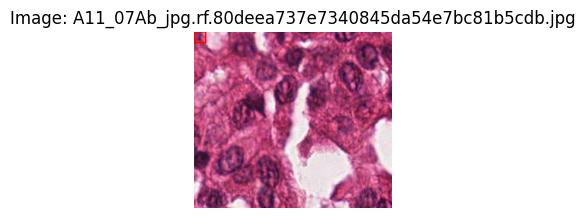

In [ ]:
import os
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

# Paths
base_path = "/content/ms-mitosis-detection2-1/train"
images_dir = os.path.join(base_path, "images")
labels_dir = os.path.join(base_path, "labels")

# Pick one sample image (change prefix if you want specific)
sample_image = [f for f in os.listdir(images_dir) if f.startswith("A11_07Ab")]
if not sample_image:
    print("No matching image found")
else:
    img_file = sample_image[0]
    lbl_file = os.path.splitext(img_file)[0] + ".txt"

    img_path = os.path.join(images_dir, img_file)
    lbl_path = os.path.join(labels_dir, lbl_file)

    # Load image
    img = Image.open(img_path)
    width, height = img.size

    # Draw bounding boxes
    draw = ImageDraw.Draw(img)

    if os.path.exists(lbl_path):
        with open(lbl_path, "r") as f:
            for line in f:
                cls, x, y, w, h = map(float, line.strip().split())
                # YOLO format → convert to pixel coords
                x1 = (x - w/2) * width
                y1 = (y - h/2) * height
                x2 = (x + w/2) * width
                y2 = (y + h/2) * height
                draw.rectangle([x1, y1, x2, y2], outline="red", width=2)
                draw.text((x1, y1 - 10), f"class {int(cls)}", fill="red")
    else:
        print("⚠️ No label file for this image")

    # Display
    dpi = 100
    plt.figure(figsize=(width/dpi, height/dpi), dpi=dpi)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Image: {img_file}")
    plt.show()


In [ ]:
from PIL import Image
import os

img_path = "/content/ms-mitosis-detection2-1/test/images/A03_00Cd_jpg.rf.0c0fc02e06ccfe6bac477f56e31b1c39.jpg"

if os.path.exists(img_path):
    img = Image.open(img_path)
    width, height = img.size
    print(f"Width: {width}, Height: {height}")
else:
    print("⚠️ Image not found:", img_path)


Width: 256, Height: 229


In [ ]:
import os
import random
import json
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np

In [ ]:
dataset_path = '/content/ms-mitosis-detection2-1'
split = 'train'


In [ ]:
import os

labels_dir = os.path.join(dataset_path, split, "labels")
sample_label_file = os.path.join(labels_dir, os.listdir(labels_dir)[0])

print("Sample label file:", sample_label_file)

with open(sample_label_file, "r") as f:
    for line in f.readlines():
        cls, x, y, w, h = map(float, line.strip().split())
        print(f"Class: {int(cls)}, x_center: {x}, y_center: {y}, width: {w}, height: {h}")


Sample label file: /content/ms-mitosis-detection2-1/train/labels/A05_01Bc_jpg.rf.f2100b089868cb07d7dd4ce3cb096c7c.txt
Class: 0, x_center: 0.029296875, y_center: 0.03275109170305677, width: 0.05859375, height: 0.06550218340611354
Class: 0, x_center: 0.029296875, y_center: 0.03275109170305677, width: 0.05859375, height: 0.06550218340611354
Class: 0, x_center: 0.029296875, y_center: 0.026200873362445413, width: 0.05859375, height: 0.05240174672489083


In [ ]:
import os

dataset_path = "/content/ms-mitosis-detection2-1"
split = "train"

images_dir = os.path.join(dataset_path, split, "images")
labels_dir = os.path.join(dataset_path, split, "labels")

# pick one random image
image_file = os.listdir(images_dir)[0]
label_file = os.path.splitext(image_file)[0] + ".txt"
label_path = os.path.join(labels_dir, label_file)

print(f"Image: {image_file}")
print(f"Label file: {label_file}\n")

# load label content
with open(label_path, "r") as f:
    annotations = []
    for line in f.readlines():
        cls, x, y, w, h = map(float, line.strip().split())
        annotations.append({
            "class": int(cls),
            "x_center": x,
            "y_center": y,
            "width": w,
            "height": h
        })

print("Annotations:")
for ann in annotations[:5]:  # show first 5
    print(ann)


Image: A12_00Ca_jpg.rf.226952d5a32ed9eb70e9fea57ede995d.jpg
Label file: A12_00Ca_jpg.rf.226952d5a32ed9eb70e9fea57ede995d.txt

Annotations:


In [ ]:
import os
from PIL import Image


dataset_path = "/content/ms-mitosis-detection2-1"
split = "train"

images_dir = os.path.join(dataset_path, split, "images")
labels_dir = os.path.join(dataset_path, split, "labels")

num_label_files = len(os.listdir(labels_dir))
print(f"📊 Number of annotated images in '{split}': {num_label_files}")

image_file = os.listdir(images_dir)[0]  # first image
label_file = os.path.splitext(image_file)[0] + ".txt"
label_path = os.path.join(labels_dir, label_file)

print(f"\n🖼️ Image: {image_file}")
print(f"📄 Label file: {label_file}")

annotations = []
with open(label_path, "r") as f:
    for line in f.readlines():
        cls, x, y, w, h = map(float, line.strip().split())
        annotations.append({
            "class": int(cls),
            "x_center": x,
            "y_center": y,
            "width": w,
            "height": h
        })

print("\n🔎 Sample Annotations:")
for ann in annotations[:5]:
    print(ann)

img_path = os.path.join(images_dir, image_file)
img = Image.open(img_path)
width, height = img.size
print(f"\n📏 Image size → Width: {width}, Height: {height}")


📊 Number of annotated images in 'train': 26064

🖼️ Image: A12_00Ca_jpg.rf.226952d5a32ed9eb70e9fea57ede995d.jpg
📄 Label file: A12_00Ca_jpg.rf.226952d5a32ed9eb70e9fea57ede995d.txt

🔎 Sample Annotations:

📏 Image size → Width: 256, Height: 229


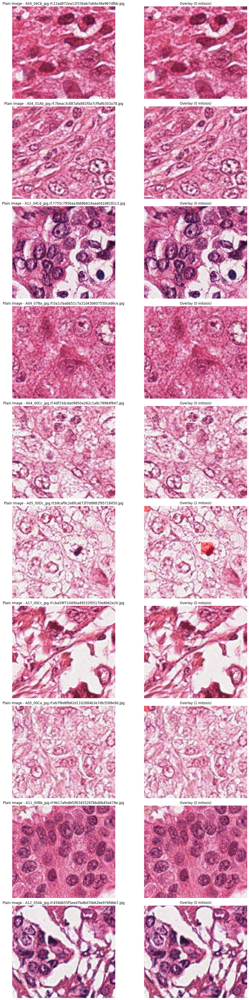

In [ ]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# =========================
# 1. Palette
# =========================
PALETTE = np.array([
    [0, 0, 0],        # 0 (background - not used)
    [255, 0, 0],      # 1 red
    [0, 255, 0],      # 2 green
    [0, 0, 255],      # 3 blue
    [255, 255, 0],    # 4 yellow
    [255, 0, 255],    # 5 magenta
    [0, 255, 255],    # 6 cyan
], dtype=np.uint8)

# =========================
# 2. Overlay function (same as yours)
# =========================
def overlay_bbox_masks(image_np, anns, alpha=0.45, num_classes=None):
    H, W, _ = image_np.shape
    mask_rgb = np.zeros((H, W, 3), dtype=np.uint8)
    used = np.zeros((H, W), dtype=np.uint8)

    max_c = (num_classes if num_classes is not None else (PALETTE.shape[0]-1))

    for ann in anns:
        x, y, w, h = ann['bbox']
        x0 = max(0, int(round(x)))
        y0 = max(0, int(round(y)))
        x1 = min(W, x0 + max(1, int(round(w))))
        y1 = min(H, y0 + max(1, int(round(h))))
        cid = int(ann.get('category_id', 1))

        if cid > max_c:
            color = PALETTE[1 + (cid - 1) % (PALETTE.shape[0]-1)]
        else:
            color = PALETTE[cid] if cid < PALETTE.shape[0] else PALETTE[1]

        mask_rgb[y0:y1, x0:x1] = color
        used[y0:y1, x0:x1] = 1

    image_f = image_np.astype(np.float32) / 255.0
    mask_f  = mask_rgb.astype(np.float32) / 255.0
    used_3  = np.repeat(used[..., None], 3, axis=2).astype(np.float32)

    blended = image_f * (1 - used_3 * alpha) + mask_f * (used_3 * alpha)
    blended = (np.clip(blended, 0, 1) * 255).astype(np.uint8)
    return blended

# =========================
# 3. Convert YOLO label to COCO bbox
# =========================
def yolo_to_coco_bbox(yolo_ann, img_w, img_h):
    cls, x_c, y_c, w, h = map(float, yolo_ann.split())
    x = (x_c - w/2) * img_w
    y = (y_c - h/2) * img_h
    w = w * img_w
    h = h * img_h
    return {
        "bbox": [x, y, w, h],
        "category_id": int(cls) + 1  # shift class IDs so they map to palette
    }

# =========================
# 4. Random samples
# =========================
dataset_path = "/content/ms-mitosis-detection2-1"
split = "train"
images_dir = os.path.join(dataset_path, split, "images")
labels_dir = os.path.join(dataset_path, split, "labels")

all_images = os.listdir(images_dir)
random_images = random.sample(all_images, 10)

# =========================
# 5. Plot images with overlays
# =========================
fig, axs = plt.subplots(len(random_images), 2, figsize=(15, 5 * len(random_images)))

if len(random_images) == 1:
    axs = [axs]  # ensure iterable for single image

for i, image_file in enumerate(random_images):
    img_path = os.path.join(images_dir, image_file)
    lbl_path = os.path.join(labels_dir, os.path.splitext(image_file)[0] + ".txt")

    img = Image.open(img_path).convert("RGB")
    image_np = np.array(img)
    H, W = image_np.shape[:2]

    anns = []
    if os.path.exists(lbl_path):
        with open(lbl_path, "r") as f:
            anns = [yolo_to_coco_bbox(line.strip(), W, H) for line in f.readlines()]

    # Left: plain
    axs[i][0].imshow(image_np)
    axs[i][0].set_title(f"Plain Image - {image_file}")
    axs[i][0].axis("off")

    # Right: overlay
    overlay = overlay_bbox_masks(image_np, anns, alpha=0.45)
    axs[i][1].imshow(overlay)
    axs[i][1].set_title(f"Overlay ({len(anns)} mitosis)")
    axs[i][1].axis("off")

plt.tight_layout()
plt.show()


[train] total images: 26064
[train] positives: 10765, negatives: 15299
[train] sampled 200 (pos: 180, neg: 20)
[valid] total images: 10908
[valid] positives: 4317, negatives: 6591
[valid] sampled 50 (pos: 45, neg: 5)
[test] total images: 6444
[test] positives: 2392, negatives: 4052
[test] sampled 50 (pos: 45, neg: 5)
Train length: 200
Val length: 50
Test length: 50


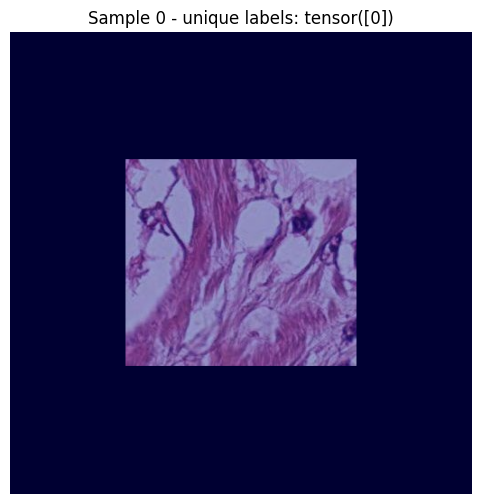

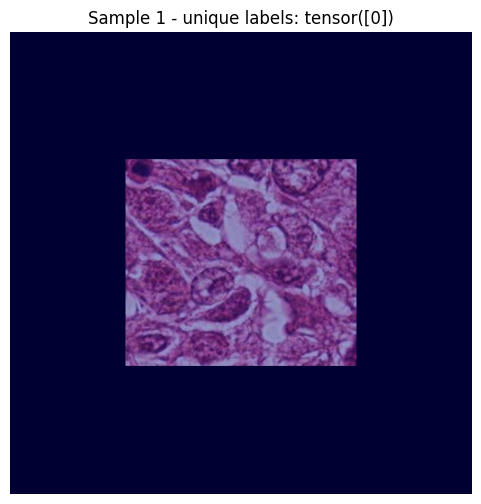

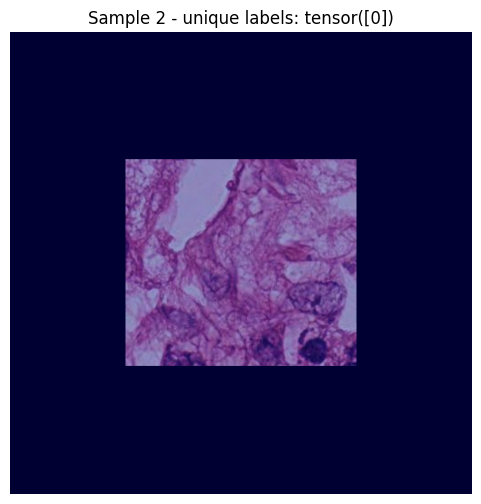

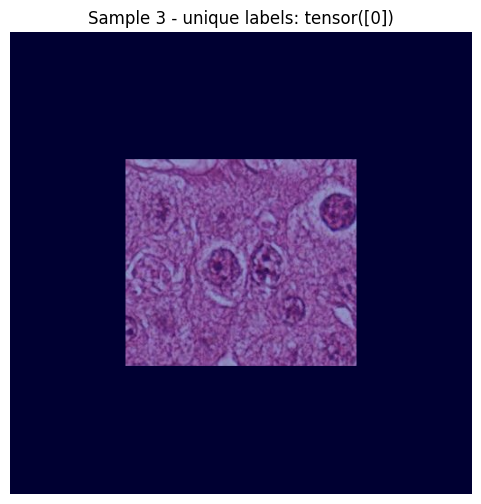

In [ ]:
import os
import cv2
import torch
import numpy as np
import random
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2


# -------------------------------
# Albumentations Transforms
# -------------------------------
IMG_SIZE = 512

def get_train_transforms():
    return A.Compose([
        A.PadIfNeeded(min_height=IMG_SIZE, min_width=IMG_SIZE, border_mode=cv2.BORDER_CONSTANT),
        A.CenterCrop(width=IMG_SIZE, height=IMG_SIZE),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.3),
        A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
        ToTensorV2()
    ])

def get_val_transforms():
    return A.Compose([
        A.PadIfNeeded(min_height=IMG_SIZE, min_width=IMG_SIZE, border_mode=cv2.BORDER_CONSTANT),
        A.CenterCrop(width=IMG_SIZE, height=IMG_SIZE),
        A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
        ToTensorV2()
    ])


# -------------------------------
# Dataset Class
# -------------------------------
class MitosisYoloDataset(Dataset):
    def __init__(self, root_dir, split='train', transforms=None,
                 max_images=2000, random_seed=42, verbose=True,
                 pos_ratio=0.90, num_classes=2):

        assert 0.0 < pos_ratio < 1.0, "pos_ratio must be in (0,1)"
        self.root_dir = root_dir
        self.split = split
        self.split_dir = os.path.join(root_dir, split)
        self.img_dir = os.path.join(self.split_dir, "images")
        self.label_dir = os.path.join(self.split_dir, "labels")
        self.transforms = transforms
        self.pos_ratio = pos_ratio
        self.num_classes = num_classes
        rng = random.Random(random_seed)

        # Collect all images
        all_imgs = [f for f in os.listdir(self.img_dir)
                    if f.lower().endswith((".jpg", ".jpeg", ".png"))]

        # Build index of labels
        anns_by_img = {}
        for img_file in all_imgs:
            label_file = os.path.splitext(img_file)[0] + ".txt"
            label_path = os.path.join(self.label_dir, label_file)
            anns = []
            if os.path.exists(label_path):
                with open(label_path, "r") as f:
                    for line in f:
                        parts = line.strip().split()
                        if len(parts) != 5:  # YOLO format: cls cx cy w h
                            continue
                        cls, cx, cy, w, h = map(float, parts)
                        anns.append({
                            "cls": int(cls),
                            "cx": cx,
                            "cy": cy,
                            "w": w,
                            "h": h
                        })
            anns_by_img[img_file] = anns

        positive_imgs = [f for f, anns in anns_by_img.items() if len(anns) > 0]
        negative_imgs = [f for f, anns in anns_by_img.items() if len(anns) == 0]

        total_available = len(all_imgs)
        if max_images is None or max_images > total_available:
            max_images = total_available

        target_pos = int(round(max_images * pos_ratio))
        target_neg = max_images - target_pos
        target_pos = min(target_pos, len(positive_imgs))
        target_neg = min(target_neg, len(negative_imgs))

        # Fill remainder if one side is too small
        if target_pos + target_neg < max_images:
            remainder = max_images - (target_pos + target_neg)
            rem_pos = len(positive_imgs) - target_pos
            take_pos = min(remainder, rem_pos)
            target_pos += take_pos
            remainder -= take_pos
            if remainder > 0:
                rem_neg = len(negative_imgs) - target_neg
                take_neg = min(remainder, rem_neg)
                target_neg += take_neg

        sampled_pos = rng.sample(positive_imgs, target_pos) if target_pos > 0 else []
        sampled_neg = rng.sample(negative_imgs, target_neg) if target_neg > 0 else []
        self.sampled_imgs = sampled_pos + sampled_neg
        self.anns_by_img = anns_by_img

        if verbose:
            print(f"[{split}] total images: {len(all_imgs)}")
            print(f"[{split}] positives: {len(positive_imgs)}, negatives: {len(negative_imgs)}")
            print(f"[{split}] sampled {len(self.sampled_imgs)} (pos: {len(sampled_pos)}, neg: {len(sampled_neg)})")

    def __len__(self):
        return len(self.sampled_imgs)

    def __getitem__(self, idx):
        img_file = self.sampled_imgs[idx]
        img_path = os.path.join(self.img_dir, img_file)

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        H, W, _ = image.shape

        # Build mask from YOLO boxes
        mask = np.zeros((H, W), dtype=np.uint8)
        for ann in self.anns_by_img[img_file]:
            cls, cx, cy, w, h = ann["cls"], ann["cx"], ann["cy"], ann["w"], ann["h"]

            # Convert YOLO → pixel box
            x0 = int((cx - w / 2) * W)
            y0 = int((cy - h / 2) * H)
            x1 = int((cx + w / 2) * W)
            y1 = int((cy + h / 2) * H)

            x0, y0 = max(0, x0), max(0, y0)
            x1, y1 = min(W, x1), min(H, y1)

            if 0 <= cls < self.num_classes:
                mask[y0:y1, x0:x1] = int(cls)

        if self.transforms:
            augmented = self.transforms(image=image, mask=mask)
            image = augmented["image"]
            mask = augmented["mask"].long()
        else:
            image = ToTensorV2()(image=image)["image"]
            mask = torch.as_tensor(mask, dtype=torch.long)

        return image, mask


# -------------------------------
# Example usage
# -------------------------------
root_dir = "/content/ms-mitosis-detection2-1"

train_dataset = MitosisYoloDataset(root_dir, split="train", transforms=get_train_transforms(), max_images=200)
val_dataset   = MitosisYoloDataset(root_dir, split="valid", transforms=get_val_transforms(), max_images=50)
test_dataset  = MitosisYoloDataset(root_dir, split="test",  transforms=get_val_transforms(), max_images=50)

print("Train length:", len(train_dataset))
print("Val length:", len(val_dataset))
print("Test length:", len(test_dataset))

# -------------------------------
# Visualization helper
# -------------------------------
def show_sample(dataset, idx=0):
    img, mask = dataset[idx]
    img_np = img.permute(1,2,0).numpy()
    img_np = (img_np * 0.5 + 0.5).clip(0,1)  # unnormalize

    plt.figure(figsize=(6,6))
    plt.imshow(img_np)
    plt.imshow(mask.numpy(), alpha=0.4, cmap="jet")
    plt.title(f"Sample {idx} - unique labels: {torch.unique(mask)}")
    plt.axis("off")
    plt.show()

# Show some samples
show_sample(train_dataset, 0)
show_sample(train_dataset, 1)
show_sample(train_dataset, 2)
show_sample(train_dataset, 3)

In [ ]:
import albumentations as A
import cv2
from albumentations.pytorch import ToTensorV2

IMG_SIZE = 512  # or 640, depending on your model

def get_train_transforms():
    # You can add stronger augmentations here if desired
    return A.Compose([
        A.PadIfNeeded(min_height=IMG_SIZE, min_width=IMG_SIZE, border_mode=cv2.BORDER_CONSTANT),
        A.CenterCrop(width=IMG_SIZE, height=IMG_SIZE),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.3),
        A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
        ToTensorV2()
    ])

def get_val_transforms():
    return A.Compose([
        A.PadIfNeeded(min_height=IMG_SIZE, min_width=IMG_SIZE, border_mode=cv2.BORDER_CONSTANT),
        A.CenterCrop(width=IMG_SIZE, height=IMG_SIZE),
        A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
        ToTensorV2()
    ])


In [ ]:
train_ds = MitosisYoloDataset(
    root_dir="/content/ms-mitosis-detection2-1",
    split="train",
    transforms=get_train_transforms(),
    max_images=200,
    pos_ratio=0.9
)

val_ds = MitosisYoloDataset(
    root_dir="/content/ms-mitosis-detection2-1",
    split="valid",
    transforms=get_val_transforms(),
    max_images=50
)

# Get one sample
img, mask = train_ds[0]
print("Train image:", img.shape, img.dtype)
print("Mask:", mask.shape, mask.dtype)


[train] total images: 26064
[train] positives: 10765, negatives: 15299
[train] sampled 200 (pos: 180, neg: 20)
[valid] total images: 10908
[valid] positives: 4317, negatives: 6591
[valid] sampled 50 (pos: 45, neg: 5)
Train image: torch.Size([3, 512, 512]) torch.float32
Mask: torch.Size([512, 512]) torch.int64


[train] total=26064, pos=10765, neg=15299
[train] sampled=13371 (pos=10765, neg=2606)


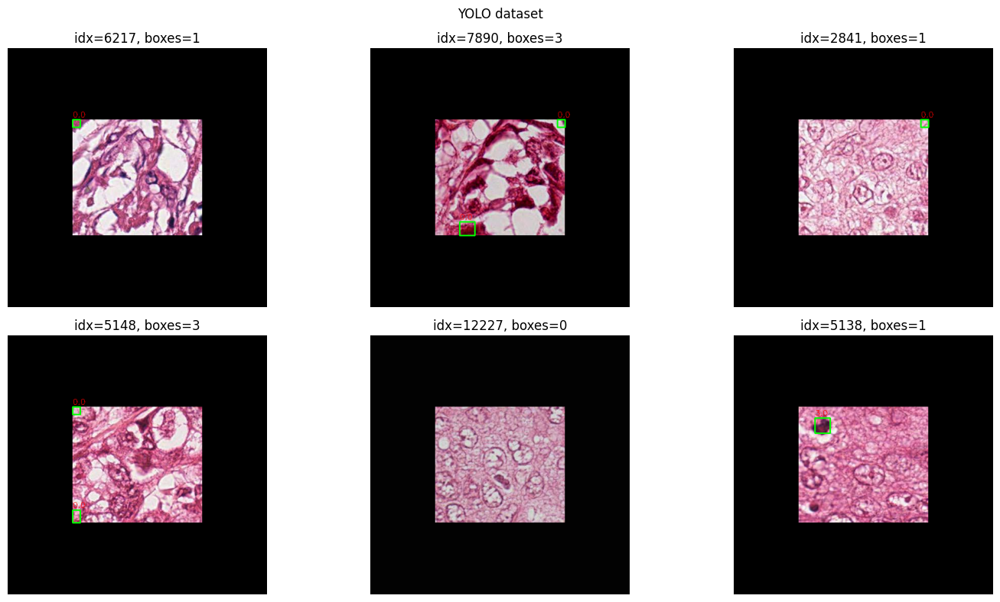

In [ ]:
import os
import cv2
import torch
import numpy as np
import random
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
import albumentations as A
from albumentations.pytorch import ToTensorV2

# -------------------------------
# 1. Transforms
# -------------------------------
IMG_SIZE = 512

def get_train_transforms():
    return A.Compose([
        A.PadIfNeeded(min_height=IMG_SIZE, min_width=IMG_SIZE, border_mode=cv2.BORDER_CONSTANT),
        A.CenterCrop(width=IMG_SIZE, height=IMG_SIZE),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.3),
        A.Normalize(mean=(0.5,0.5,0.5), std=(0.5,0.5,0.5)),
        ToTensorV2()
    ], bbox_params=A.BboxParams(format="pascal_voc", label_fields=["labels"], min_visibility=0.1))


def get_val_transforms():
    return A.Compose([
        A.PadIfNeeded(min_height=IMG_SIZE, min_width=IMG_SIZE, border_mode=cv2.BORDER_CONSTANT),
        A.CenterCrop(width=IMG_SIZE, height=IMG_SIZE),
        A.Normalize(mean=(0.5,0.5,0.5), std=(0.5,0.5,0.5)),
        ToTensorV2()
    ], bbox_params=A.BboxParams(format="pascal_voc", label_fields=["labels"], min_visibility=0.1))

# -------------------------------
# 2. Dataset Class
# -------------------------------
class MitosisYoloDataset(Dataset):
    def __init__(self, root_dir, split='train', transforms=None,
                 max_images=None, random_seed=42, verbose=True,
                 pos_ratio=0.9, num_classes=2):

        self.root_dir = root_dir
        self.split = split
        self.img_dir = os.path.join(root_dir, split, "images")
        self.label_dir = os.path.join(root_dir, split, "labels")
        self.transforms = transforms
        self.num_classes = num_classes
        rng = random.Random(random_seed)

        all_imgs = [f for f in os.listdir(self.img_dir) if f.lower().endswith((".jpg",".jpeg",".png"))]

        # Collect annotations
        anns_by_img = {}
        for img_file in all_imgs:
            label_file = os.path.splitext(img_file)[0] + ".txt"
            label_path = os.path.join(self.label_dir, label_file)
            anns = []
            if os.path.exists(label_path):
                with open(label_path, "r") as f:
                    for line in f:
                        parts = line.strip().split()
                        if len(parts) == 5:
                            cls, cx, cy, w, h = map(float, parts)
                            anns.append({"cls": int(cls), "cx": cx, "cy": cy, "w": w, "h": h})
            anns_by_img[img_file] = anns

        positive_imgs = [f for f,a in anns_by_img.items() if len(a) > 0]
        negative_imgs = [f for f,a in anns_by_img.items() if len(a) == 0]

        total_available = len(all_imgs)
        if max_images is None or max_images > total_available:
            max_images = total_available

        target_pos = int(round(max_images * pos_ratio))
        target_neg = max_images - target_pos
        target_pos = min(target_pos, len(positive_imgs))
        target_neg = min(target_neg, len(negative_imgs))

        sampled_pos = rng.sample(positive_imgs, target_pos) if target_pos > 0 else []
        sampled_neg = rng.sample(negative_imgs, target_neg) if target_neg > 0 else []

        self.sampled_imgs = sampled_pos + sampled_neg
        self.anns_by_img = anns_by_img

        if verbose:
            print(f"[{split}] total={len(all_imgs)}, pos={len(positive_imgs)}, neg={len(negative_imgs)}")
            print(f"[{split}] sampled={len(self.sampled_imgs)} (pos={len(sampled_pos)}, neg={len(sampled_neg)})")

    def __len__(self):
        return len(self.sampled_imgs)

    def __getitem__(self, idx):
        img_file = self.sampled_imgs[idx]
        img_path = os.path.join(self.img_dir, img_file)

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        H, W, _ = image.shape

        anns = self.anns_by_img[img_file]
        bboxes, labels = [], []
        for ann in anns:
            cls, cx, cy, w, h = ann["cls"], ann["cx"], ann["cy"], ann["w"], ann["h"]
            x0 = (cx - w/2) * W
            y0 = (cy - h/2) * H
            x1 = (cx + w/2) * W
            y1 = (cy + h/2) * H
            bboxes.append([x0,y0,x1,y1])
            labels.append(int(cls))

        if self.transforms:
            transformed = self.transforms(image=image, bboxes=bboxes, labels=labels)
            image = transformed["image"]
            bboxes = transformed["bboxes"]
            labels = transformed["labels"]

        target = {"bboxes": bboxes, "labels": labels}
        return image, target

# -------------------------------
# 3. Visualization
# -------------------------------
def unnormalize(img_tensor):
    img = img_tensor.permute(1,2,0).cpu().numpy()
    img = img * 0.5 + 0.5
    return np.clip(img,0,1)

def visualize_yolo_dataset(dataset, num_samples=6, seed=0, title="YOLO dataset"):
    np.random.seed(seed)
    idxs = np.random.choice(len(dataset), size=min(num_samples,len(dataset)), replace=False)
    cols = 3
    rows = (len(idxs)+cols-1)//cols
    plt.figure(figsize=(5*cols,4*rows))

    for i, idx in enumerate(idxs):
        img_t, target = dataset[idx]
        img_np = unnormalize(img_t)
        img_np = (img_np*255).astype(np.uint8).copy()

        for bbox, label in zip(target["bboxes"], target["labels"]):
            x0,y0,x1,y1 = map(int,bbox)
            cv2.rectangle(img_np,(x0,y0),(x1,y1),(0,255,0),2)
            cv2.putText(img_np,str(label),(x0,max(10,y0-5)),cv2.FONT_HERSHEY_SIMPLEX,0.5,(255,0,0),1)

        ax = plt.subplot(rows,cols,i+1)
        ax.imshow(img_np)
        ax.set_title(f"idx={idx}, boxes={len(target['bboxes'])}")
        ax.axis("off")

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# -------------------------------
# 4. Test Run
# -------------------------------
root_dir = "/content/ms-mitosis-detection2-1"  # change if needed
train_dataset = MitosisYoloDataset(root_dir, split="train", transforms=get_train_transforms())
visualize_yolo_dataset(train_dataset, num_samples=6)


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# =========================
# Building Blocks
# =========================
class DoubleConv(nn.Module):
    """(Conv2D => BN => ReLU) * 2"""
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.double_conv(x)


class Down(nn.Module):
    """Downscaling with maxpool + double conv"""
    def __init__(self, in_channels, out_channels):
        super(Down, self).__init__()
        self.down = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.down(x)


class Up(nn.Module):
    """Upscaling then double conv"""
    def __init__(self, in_channels, out_channels, bilinear=True):
        super(Up, self).__init__()

        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels)
        else:
            self.up = nn.ConvTranspose2d(in_channels // 2, in_channels // 2,
                                         kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)

        # Pad x1 to match x2 size (if needed)
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]
        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])

        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)


# =========================
# U-Net Model
# =========================
class UNet(nn.Module):
    def __init__(self, n_channels=3, n_classes=1, bilinear=True):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        factor = 2 if bilinear else 1
        self.down4 = Down(512, 1024 // factor)

        self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)

    def forward(self, x):
        x1 = self.inc(x)       # 64
        x2 = self.down1(x1)    # 128
        x3 = self.down2(x2)    # 256
        x4 = self.down3(x3)    # 512
        x5 = self.down4(x4)    # 1024

        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits


# =========================
# Example Usage
# =========================
if __name__ == "__main__":
    model = UNet(n_channels=3, n_classes=1)  # n_classes=1 → binary mask
    x = torch.randn(1, 3, 128, 128)  # batch of images
    y = model(x)
    print("Input:", x.shape)
    print("Output:", y.shape)


Input: torch.Size([1, 3, 128, 128])
Output: torch.Size([1, 1, 128, 128])


In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm

# Paths
root_dir = "/content/ms-mitosis-detection2-1"
splits = ["train", "valid", "test"]

# Make masks for each split
for split in splits:
    img_dir = os.path.join(root_dir, split, "images")
    label_dir = os.path.join(root_dir, split, "labels")
    mask_dir = os.path.join(root_dir, split, "masks")
    os.makedirs(mask_dir, exist_ok=True)

    image_files = [f for f in os.listdir(img_dir) if f.endswith(".png") or f.endswith(".jpg")]

    print(f"[{split}] Found {len(image_files)} images")

    for img_name in tqdm(image_files):
        # Load image just to get shape
        img_path = os.path.join(img_dir, img_name)
        img = cv2.imread(img_path)
        H, W = img.shape[:2]

        # Start empty mask
        mask = np.zeros((H, W), dtype=np.uint8)

        # Corresponding YOLO label file
        label_path = os.path.join(label_dir, os.path.splitext(img_name)[0] + ".txt")
        if os.path.exists(label_path):
            with open(label_path, "r") as f:
                for line in f.readlines():
                    cls, cx, cy, w, h = map(float, line.strip().split())
                    # Convert YOLO → pixel coords
                    x0 = int((cx - w/2) * W)
                    y0 = int((cy - h/2) * H)
                    x1 = int((cx + w/2) * W)
                    y1 = int((cy + h/2) * H)

                    # Draw filled rectangle on mask
                    cv2.rectangle(mask, (x0, y0), (x1, y1), color=255, thickness=-1)

        # Save mask
        mask_path = os.path.join(mask_dir, os.path.splitext(img_name)[0] + ".png")
        cv2.imwrite(mask_path, mask)

print("✅ Masks generated and saved!")


[train] Found 26064 images


100%|██████████| 26064/26064 [00:14<00:00, 1770.92it/s]


[valid] Found 10908 images


100%|██████████| 10908/10908 [00:06<00:00, 1718.74it/s]


[test] Found 6444 images


100%|██████████| 6444/6444 [00:03<00:00, 1819.91it/s]

✅ Masks generated and saved!


In [ ]:
print(model)


UNet(
  (inc): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (down1): Down(
    (down): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         

In [ ]:
!pip install ultralytics --quiet
!pip install torch==2.5.1 torchvision==0.20.1 --index-url https://download.pytorch.org/whl/cu121


Looking in indexes: https://download.pytorch.org/whl/cu121
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.4/780.4 MB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.3/7.3 MB 107.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 105.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 56.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 132.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 14.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/

In [ ]:
from ultralytics import YOLO

# Load YOLOv8n model
model = YOLO("yolov8n.pt")
print("✅ YOLOv8n loaded successfully!")

# Run inference test
results = model.predict(source="https://ultralytics.com/images/bus.jpg", show=True)


100%|██████████| 6.23M/6.23M [00:00<00:00, 54.4MB/s]
/usr/local/lib/python3.12/dist-packages/ultralytics/nn/tasks.py:567: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  retur

✅ YOLOv8n loaded successfully!



100%|██████████| 134k/134k [00:00<00:00, 4.28MB/s]
image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 131.7ms
Speed: 15.9ms preprocess, 131.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


In [ ]:
import torch
from ultralytics import YOLO

# Allow Ultralytics custom modules to be unpickled
torch.serialization.add_safe_globals([
    torch.nn.Sequential,                    # standard Sequential
    torch.nn.Conv2d,                        # Conv2D
    torch.nn.BatchNorm2d,                   # BatchNorm
    torch.nn.SiLU,                          # SiLU activation
    torch.nn.ModuleList,                    # ModuleList
])

# Also allow Ultralytics-specific classes
import ultralytics.nn.modules as um
torch.serialization.add_safe_globals([
    um.Conv,
    um.C2f,
    um.Bottleneck,
])

# ✅ Now load the model safely
model = YOLO("yolov8n.pt")
print("✅ YOLOv8n loaded successfully!")


✅ YOLOv8n loaded successfully!


/usr/local/lib/python3.12/dist-packages/ultralytics/nn/tasks.py:567: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map_location='cpu'), file  # load


In [ ]:
!pip install ultralytics



Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 176.9ms
Speed: 7.7ms preprocess, 176.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 480)


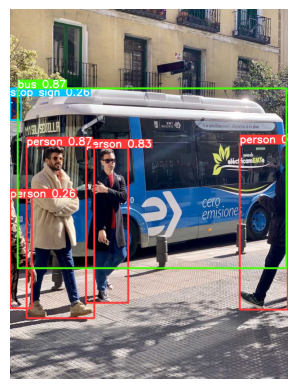

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Load pretrained YOLOv8n model
model = YOLO("yolov8n.pt")

# Run inference
results = model.predict(source="https://ultralytics.com/images/bus.jpg", conf=0.25, show=False)

# Plot inside notebook (instead of OpenCV window)
for r in results:
    im_array = r.plot()
    plt.imshow(im_array[..., ::-1])  # convert BGR -> RGB
    plt.axis("off")
    plt.show()


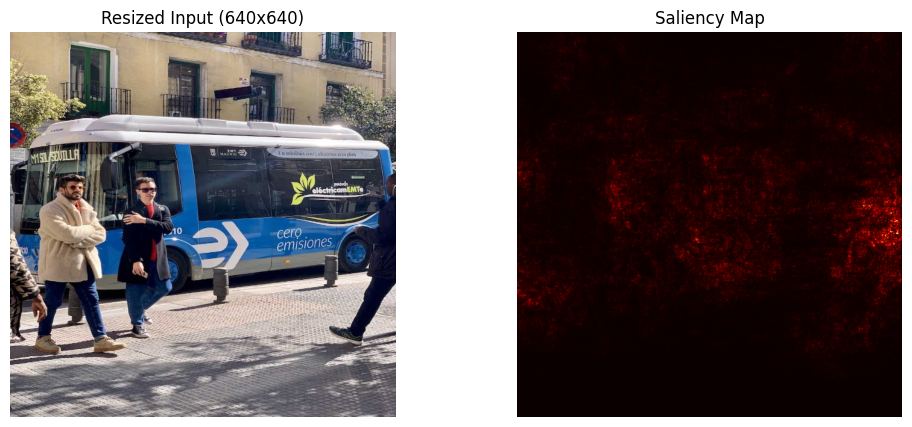

In [ ]:
import torch
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
import numpy as np

# Load YOLO model
model = YOLO("yolov8n.pt")  # replace with your trained weights if needed

# Read image
img = cv2.imread("bus.jpg")[:, :, ::-1].copy()  # BGR → RGB

# Resize/pad to YOLO input size (640x640)
img_resized = cv2.resize(img, (640, 640))

# Convert to tensor
img_tensor = torch.from_numpy(img_resized).permute(2,0,1).float().unsqueeze(0) / 255.0

# Choose device (CPU if no GPU available)
device = "cuda" if torch.cuda.is_available() else "cpu"
img_tensor = img_tensor.to(device)
model.model.to(device)

# Enable gradients
img_tensor.requires_grad_()

# Forward pass through model
outputs = model.model(img_tensor)[0]  # raw outputs

# Take scalar score (max logit)
score = outputs.max()
score.backward()

# Get saliency map
saliency = img_tensor.grad.abs().max(dim=1)[0].detach().cpu()

# Plot
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(img_resized)
plt.title("Resized Input (640x640)")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(saliency[0], cmap="hot")
plt.title("Saliency Map")
plt.axis("off")

plt.show()


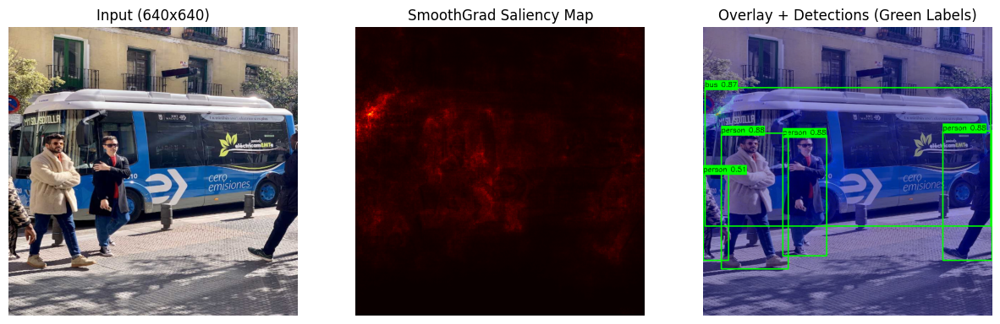

In [ ]:
import torch
import cv2
import matplotlib.pyplot as plt
import numpy as np
from ultralytics import YOLO

# -------------------
# Load YOLO model
# -------------------
model = YOLO("yolov8n.pt")
device = "cuda" if torch.cuda.is_available() else "cpu"
model.model.to(device)

# -------------------
# Load image
# -------------------
img = cv2.imread("bus.jpg")[:, :, ::-1].copy()  # BGR->RGB
img_resized = cv2.resize(img, (640, 640))

# Convert to tensor
img_tensor = torch.from_numpy(img_resized).permute(2,0,1).float().unsqueeze(0) / 255.0
img_tensor = img_tensor.to(device)

# -------------------
# Function to compute saliency with noise (SmoothGrad)
# -------------------
def compute_saliency(img_tensor, noise_level=0.2):
    noisy_img = img_tensor + noise_level * torch.randn_like(img_tensor)
    noisy_img.requires_grad_()
    outputs = model.model(noisy_img)[0]
    score = outputs.max()
    score.backward()
    saliency = noisy_img.grad.abs().max(dim=1)[0].detach().cpu().numpy()[0]
    return saliency

# -------------------
# SmoothGrad: average over multiple noisy saliency maps
# -------------------
n_samples = 20
all_saliencies = []
for _ in range(n_samples):
    sal = compute_saliency(img_tensor, noise_level=0.1)
    all_saliencies.append(sal)

smooth_saliency = np.mean(all_saliencies, axis=0)

# Normalize
smooth_saliency = (smooth_saliency - smooth_saliency.min()) / (smooth_saliency.max() - smooth_saliency.min() + 1e-8)
smooth_saliency = np.uint8(smooth_saliency * 255)

# Heatmap
heatmap = cv2.applyColorMap(smooth_saliency, cv2.COLORMAP_JET)
heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

# Overlay
overlay = cv2.addWeighted(img_resized, 0.6, heatmap, 0.4, 0)

# -------------------
# Add YOLO detections on top of overlay
# -------------------
results = model(img_resized, verbose=False)
overlay_with_boxes = overlay.copy()

for r in results:
    boxes = r.boxes.xyxy.cpu().numpy().astype(int)
    confs = r.boxes.conf.cpu().numpy()
    clss = r.boxes.cls.cpu().numpy().astype(int)

    for (x1,y1,x2,y2), conf, cls in zip(boxes, confs, clss):
        # Green bounding box
        cv2.rectangle(overlay_with_boxes, (x1,y1), (x2,y2), (0,255,0), 2)

        # Label with background for readability
        label = f"{model.names[cls]} {conf:.2f}"
        (tw, th), baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
        cv2.rectangle(overlay_with_boxes, (x1, y1-th-4), (x1+tw, y1+baseline), (0,255,0), -1)  # filled background
        cv2.putText(overlay_with_boxes, label, (x1, y1-2),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,0,0), 1)  # black text on green background

# -------------------
# Final Plot (3 panels)
# -------------------
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(img_resized)
plt.title("Input (640x640)")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(smooth_saliency, cmap="hot")
plt.title("SmoothGrad Saliency Map")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(overlay_with_boxes)
plt.title("Overlay + Detections (Green Labels)")
plt.axis("off")

plt.show()


In [ ]:
import yaml

dataset_yaml = {
    "path": "/content/ms-mitosis-detection2-1",  # root of your dataset
    "train": "train/images",   # training images folder
    "val": "valid/images",     # validation images folder
    "test": "test/images",     # test images folder
    "nc": 1,                   # number of classes
    "names": ["mitosis"]       # class name
}

with open("mitosis.yaml", "w") as f:
    yaml.dump(dataset_yaml, f, default_flow_style=False)

print("✅ mitosis.yaml created")


✅ mitosis.yaml created


In [ ]:
import os
import random
import shutil

root = "/content/ms-mitosis-detection2-1"
splits = ["train", "valid"]  # only sample for train & valid

# destination folder (new dataset with filtered negatives)
dst_root = "/content/ms-mitosis-balanced"
os.makedirs(dst_root, exist_ok=True)

for split in splits:
    img_dir = os.path.join(root, split, "images")
    lbl_dir = os.path.join(root, split, "labels")

    dst_img_dir = os.path.join(dst_root, split, "images")
    dst_lbl_dir = os.path.join(dst_root, split, "labels")
    os.makedirs(dst_img_dir, exist_ok=True)
    os.makedirs(dst_lbl_dir, exist_ok=True)

    pos, neg = [], []

    # classify each image as positive (≥1 mitosis) or negative (empty label file)
    for lbl_file in os.listdir(lbl_dir):
        lbl_path = os.path.join(lbl_dir, lbl_file)
        with open(lbl_path, "r") as f:
            lines = f.readlines()
        if len(lines) > 0:
            pos.append(lbl_file)
        else:
            neg.append(lbl_file)

    # keep all positives, sample small % of negatives
    keep_neg = random.sample(neg, min(len(neg)//5, len(neg)))  # 20% of negatives
    keep = pos + keep_neg

    # copy images + labels
    for lbl_file in keep:
        img_file = lbl_file.replace(".txt", ".jpg")  # adjust extension if needed
        shutil.copy(os.path.join(img_dir, img_file), os.path.join(dst_img_dir, img_file))
        shutil.copy(os.path.join(lbl_dir, lbl_file), os.path.join(dst_lbl_dir, lbl_file))

    print(f"✅ {split}: {len(pos)} positives + {len(keep_neg)} negatives → {len(keep)} total")

print("\nFiltered dataset ready at:", dst_root)


✅ train: 10765 positives + 3059 negatives → 13824 total
✅ valid: 4317 positives + 1318 negatives → 5635 total

Filtered dataset ready at: /content/ms-mitosis-balanced


In [ ]:
import os
import yaml

# -----------------------------
# 1. Create mitosis.yaml
# -----------------------------
dataset_yaml = {
    "path": "/content/ms-mitosis-detection2-1",
    "train": "train/images",
    "val": "valid/images",
    "test": "test/images",
    "nc": 1,
    "names": ["mitosis"]
}

with open("mitosis.yaml", "w") as f:
    yaml.dump(dataset_yaml, f, default_flow_style=False)

print("✅ mitosis.yaml created at mitosis.yaml")

# -----------------------------
# 2. Fix all label files
# -----------------------------
base_dir = "/content/ms-mitosis-detection2-1"
splits = ["train", "valid", "test"]

fixed_files = 0
total_files = 0

for split in splits:
    lbl_dir = os.path.join(base_dir, split, "labels")
    if not os.path.exists(lbl_dir):
        print(f"⚠️ No labels folder found for {split}, skipping...")
        continue

    for lbl_file in os.listdir(lbl_dir):
        if not lbl_file.endswith(".txt"):
            continue
        total_files += 1

        lbl_path = os.path.join(lbl_dir, lbl_file)
        new_lines = []
        with open(lbl_path, "r") as f:
            for line in f.readlines():
                parts = line.strip().split()
                if len(parts) >= 5:
                    # Force class id = 0, keep the bbox coords
                    new_lines.append("0 " + " ".join(parts[1:]) + "\n")

        # Overwrite the file
        with open(lbl_path, "w") as f:
            f.writelines(new_lines)

        fixed_files += 1

print(f"✅ Fixed labels: {fixed_files}/{total_files} files updated")


✅ mitosis.yaml created at mitosis.yaml
✅ Fixed labels: 43416/43416 files updated


In [ ]:
import yaml

dataset_yaml = {
    "path": "/content/ms-mitosis-detection2-1",
    "train": "images/train",
    "val": "images/valid",
    "test": "images/test",
    "nc": 1,
    "names": ["mitosis"]
}

with open("mitosis.yaml", "w") as f:
    yaml.dump(dataset_yaml, f, default_flow_style=False)

print("✅ mitosis.yaml created at mitosis.yaml")


✅ mitosis.yaml created at mitosis.yaml


In [ ]:
import os

base_dir = "/content/ms-mitosis-detection2-1"
splits = ["train", "valid", "test"]

invalid_count = 0
empty_count = 0

for split in splits:
    lbl_dir = os.path.join(base_dir, split, "labels")
    if not os.path.exists(lbl_dir):
        continue

    for lbl_file in os.listdir(lbl_dir):
        if not lbl_file.endswith(".txt"):
            continue

        lbl_path = os.path.join(lbl_dir, lbl_file)
        with open(lbl_path, "r") as f:
            lines = f.readlines()

        new_lines = []
        for line in lines:
            parts = line.strip().split()
            if len(parts) < 5:
                continue  # skip bad lines
            cls_id = 0   # force single class
            coords = parts[1:]
            if len(coords) == 4:  # x y w h
                new_lines.append(f"{cls_id} {' '.join(coords)}\n")
            else:
                invalid_count += 1

        if new_lines:
            with open(lbl_path, "w") as f:
                f.writelines(new_lines)
        else:
            # if file had no valid boxes → delete it
            os.remove(lbl_path)
            empty_count += 1

print(f"✅ Cleanup done. Invalid lines removed: {invalid_count}, Empty labels deleted: {empty_count}")


✅ Cleanup done. Invalid lines removed: 0, Empty labels deleted: 25942


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
img_tensor = img_tensor.to(device)


Found 5 images
✅ Saved results/A12_01Bc_jpg.rf.22f6b81f7e3b80f19cc0dc1aedd5af9a_result.png


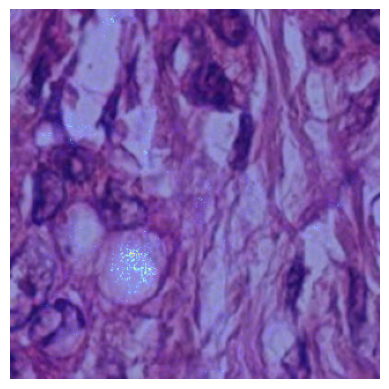

✅ Saved results/A11_01Db_jpg.rf.4935cc3e54a2b6541ba8e7fdeae40fc6_result.png


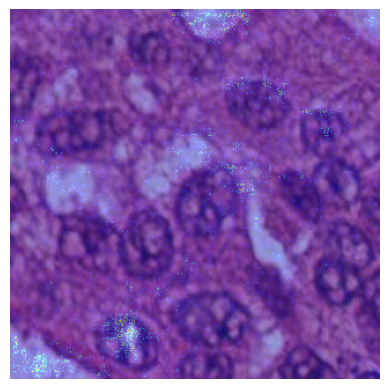

✅ Saved results/A07_00Bc_jpg.rf.1068eb4732b11128ecf598d2daeba20d_result.png


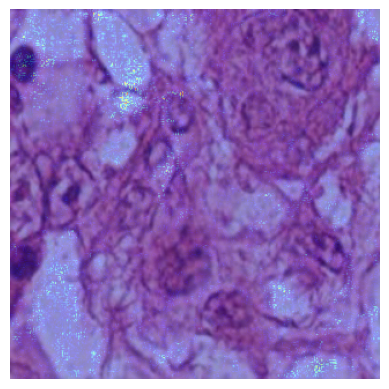

✅ Saved results/A14_03Bd_jpg.rf.3674cc94ee0997c541fa6c15050938b9_result.png


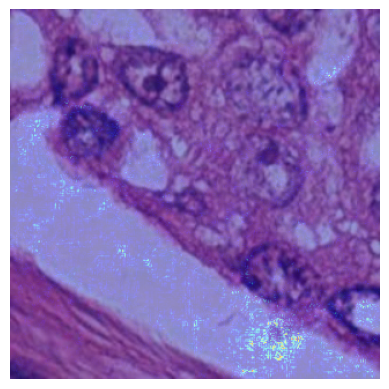

✅ Saved results/A12_06Bc_jpg.rf.28569e865a8b2dafeb1848f3a4e11c4e_result.png


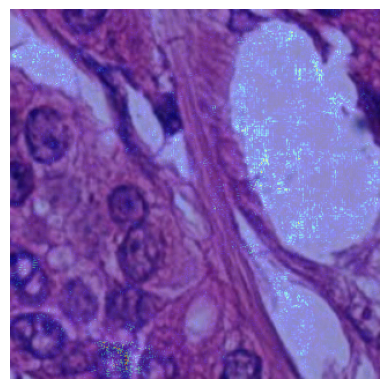

In [ ]:
import glob

# Correct path to your dataset
image_paths = glob.glob("ms-mitosis-detection2-1/test/images/*")[:5]

print("Found", len(image_paths), "images")
for p in image_paths:
    process_image(p)


Found 5635 images


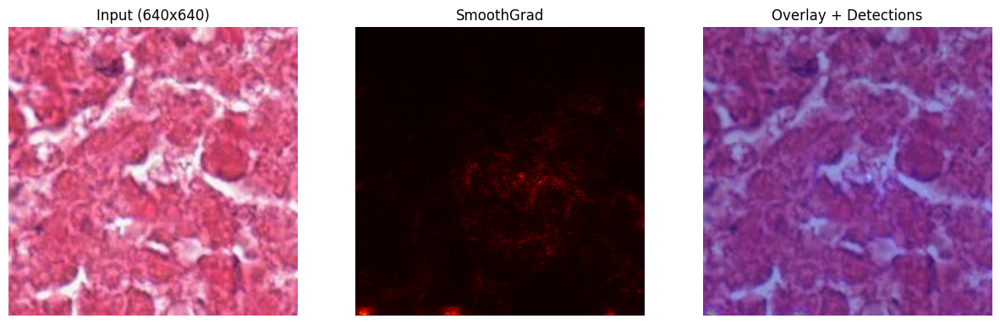

✅ Saved results_saliency/A04_04Ad_jpg_result.png


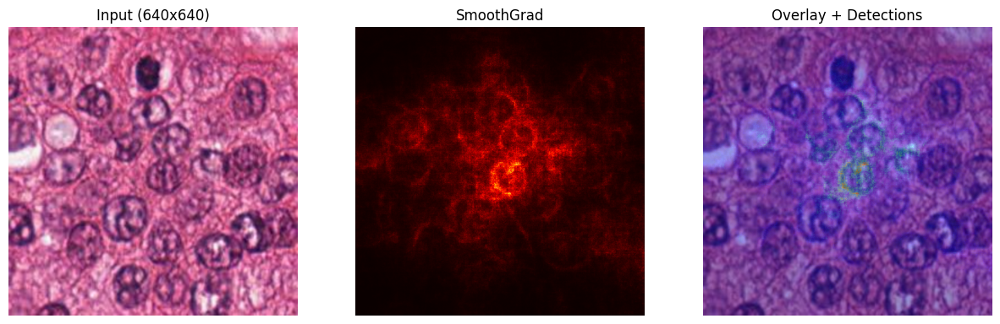

✅ Saved results_saliency/A11_03Bb_jpg_result.png


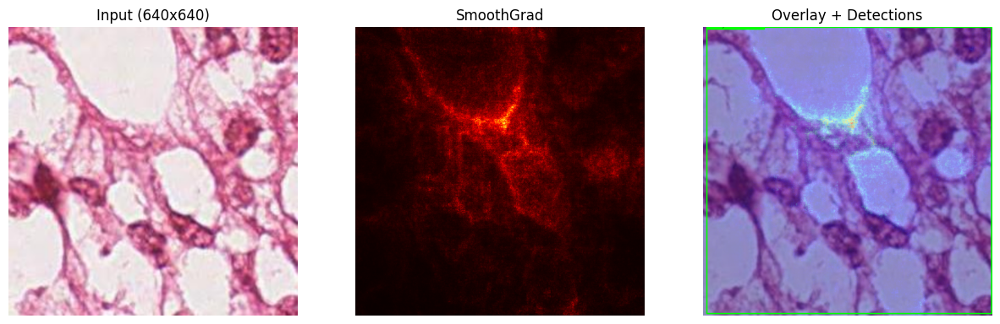

✅ Saved results_saliency/A10_01Ad_jpg_result.png


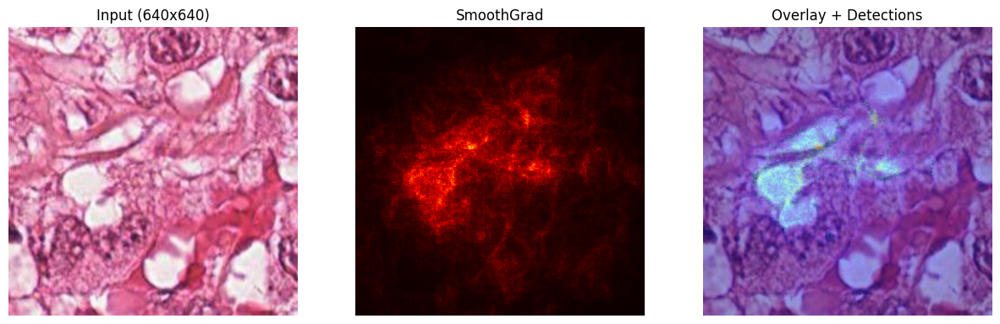

✅ Saved results_saliency/A07_03Ac_jpg_result.png


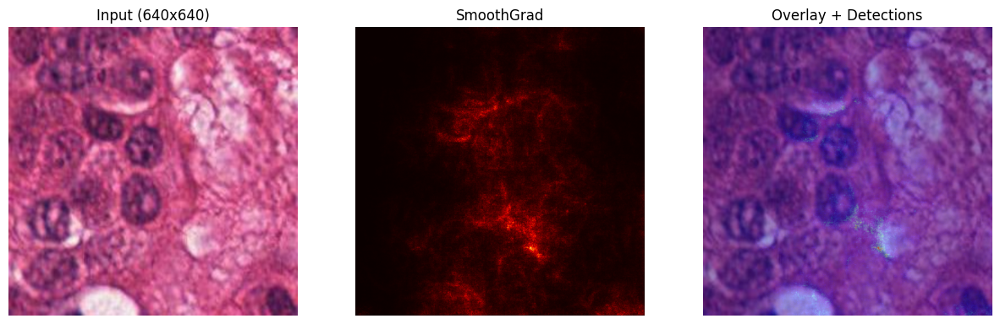

✅ Saved results_saliency/A11_04Ba_jpg_result.png


In [ ]:
import torch
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
from ultralytics import YOLO
from glob import glob

# -------------------
# Setup
# -------------------
device = "cuda" if torch.cuda.is_available() else "cpu"
model = YOLO("yolov8n.pt")   # or your trained weights e.g. "runs/detect/mitosis_yolov8/weights/best.pt"
model.model.to(device)

# Input/Output paths
dataset_dir = "./ms-mitosis-balanced/valid/images"   # 👈 change to train/images if you want training set
output_dir = "results_saliency"
os.makedirs(output_dir, exist_ok=True)

# -------------------
# Saliency function
# -------------------
def compute_saliency(img_tensor, noise_level=0.2):
    noisy_img = img_tensor + noise_level * torch.randn_like(img_tensor)
    noisy_img.requires_grad_()
    outputs = model.model(noisy_img)[0]
    score = outputs.max()
    score.backward()
    saliency = noisy_img.grad.abs().max(dim=1)[0].detach().cpu().numpy()[0]
    return saliency

# -------------------
# Loop through images
# -------------------
image_paths = glob(os.path.join(dataset_dir, "*.jpg")) + glob(os.path.join(dataset_dir, "*.png"))
print(f"Found {len(image_paths)} images")

for img_path in image_paths[:5]:   # 👈 limit to 5 for testing; remove [:5] to process all
    # Load + preprocess image
    img = cv2.imread(img_path)[:, :, ::-1].copy()
    img_resized = cv2.resize(img, (640, 640))
    img_tensor = torch.from_numpy(img_resized).permute(2,0,1).float().unsqueeze(0) / 255.0
    img_tensor = img_tensor.to(device)

    # SmoothGrad
    n_samples = 10   # fewer samples for speed on CPU
    all_saliencies = []
    for _ in range(n_samples):
        sal = compute_saliency(img_tensor, noise_level=0.1)
        all_saliencies.append(sal)
    smooth_saliency = np.mean(all_saliencies, axis=0)
    smooth_saliency = (smooth_saliency - smooth_saliency.min()) / (smooth_saliency.max() - smooth_saliency.min() + 1e-8)
    smooth_saliency = np.uint8(smooth_saliency * 255)

    # Heatmap
    heatmap = cv2.applyColorMap(smooth_saliency, cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    # Overlay with detections
    overlay = cv2.addWeighted(img_resized, 0.6, heatmap, 0.4, 0)
    results = model(img_resized, verbose=False)
    overlay_with_boxes = overlay.copy()

    for r in results:
        boxes = r.boxes.xyxy.cpu().numpy().astype(int)
        confs = r.boxes.conf.cpu().numpy()
        clss = r.boxes.cls.cpu().numpy().astype(int)

        for (x1,y1,x2,y2), conf, cls in zip(boxes, confs, clss):
            cv2.rectangle(overlay_with_boxes, (x1,y1), (x2,y2), (0,255,0), 2)
            label = f"{model.names[cls]} {conf:.2f}"
            (tw, th), baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
            cv2.rectangle(overlay_with_boxes, (x1, y1-th-4), (x1+tw, y1+baseline), (0,255,0), -1)
            cv2.putText(overlay_with_boxes, label, (x1, y1-2),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,0,0), 1)

    # Plot & Save
    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1); plt.imshow(img_resized); plt.title("Input (640x640)"); plt.axis("off")
    plt.subplot(1,3,2); plt.imshow(smooth_saliency, cmap="hot"); plt.title("SmoothGrad"); plt.axis("off")
    plt.subplot(1,3,3); plt.imshow(overlay_with_boxes); plt.title("Overlay + Detections"); plt.axis("off")

    save_name = os.path.basename(img_path).split('.')[0] + "_result.png"
    save_path = os.path.join(output_dir, save_name)
    plt.savefig(save_path, bbox_inches="tight")
    plt.show()    # 👈 display inline
    plt.close()

    print(f"✅ Saved {save_path}")
